# Regression Assignment - Lasso and Riggo

In [1]:
# Importing the required libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import linear_model
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
import os
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing the dataset
df = pd.read_csv("C:/Users/use/Desktop/train.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

In [4]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
df.shape

(1460, 81)

In [6]:
missing_df = df.isna()

In [7]:
count_missing_df = missing_df.sum()

In [8]:
# Knowing the missing percentage of each variable
percentage_missing = count_missing_df/len(df)
percentage_missing

Id               0.000000
MSSubClass       0.000000
MSZoning         0.000000
LotFrontage      0.177397
LotArea          0.000000
Street           0.000000
Alley            0.937671
LotShape         0.000000
LandContour      0.000000
Utilities        0.000000
LotConfig        0.000000
LandSlope        0.000000
Neighborhood     0.000000
Condition1       0.000000
Condition2       0.000000
BldgType         0.000000
HouseStyle       0.000000
OverallQual      0.000000
OverallCond      0.000000
YearBuilt        0.000000
YearRemodAdd     0.000000
RoofStyle        0.000000
RoofMatl         0.000000
Exterior1st      0.000000
Exterior2nd      0.000000
MasVnrType       0.005479
MasVnrArea       0.005479
ExterQual        0.000000
ExterCond        0.000000
Foundation       0.000000
                   ...   
BedroomAbvGr     0.000000
KitchenAbvGr     0.000000
KitchenQual      0.000000
TotRmsAbvGrd     0.000000
Functional       0.000000
Fireplaces       0.000000
FireplaceQu      0.472603
GarageType  

In [9]:
# Dropping the variables with high missing percentage 
df = df.drop(['Id','Alley', 'PoolQC'],1)

In [10]:
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF'

<Figure size 1440x720 with 0 Axes>

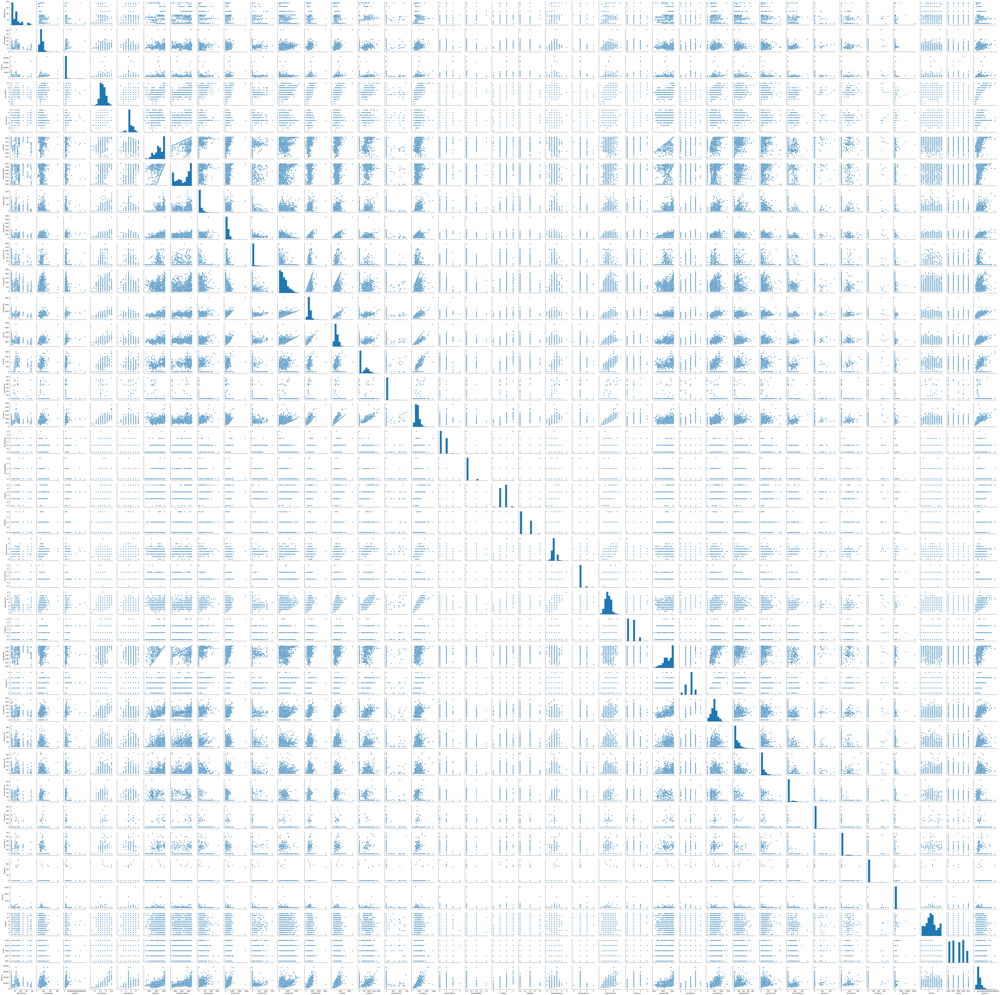

In [11]:
#Pairwise plot for all numeric variables
plt.figure(figsize=(20, 10))
sns.pairplot(df)
plt.show()


In [12]:
# Value count of each varibales 
for column in df:
    print(df[column].astype('category').value_counts())

20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64
60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
21.0      23
90.0      23
68.0      19
64.0      19
24.0      19
73.0      18
55.0      17
79.0      17
72.0      17
63.0      17
100.0     16
66.0      15
74.0      15
51.0      15
52.0      14
59.0      13
82.0      12
40.0      12
57.0      12
67.0      12
43.0      12
71.0      12
        ... 
124.0      2
122.0      2
313.0      2
118.0      2
109.0      2
97.0       2
116.0      2
101.0      2
114.0      2
115.0      2
112.0      1
38.0       1
168.0      1
160.0      1
33.0       1
153.0      1
152.0      1
150.0      1
149.0      1
39.0       1
111.0      1
144.0      1
141.0 

In [13]:
df['BsmtCond'].value_counts()

TA    1311
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64

In [14]:
# Deleting 'Bsmtcond' as it seems a single value variable.
df = df.drop(['BsmtCond'],axis = 1)

In [15]:
df['GarageQual'].value_counts()

TA    1311
Fa      48
Gd      14
Po       3
Ex       3
Name: GarageQual, dtype: int64

In [16]:
# Deleting the variable "GarageQual" as it also seems to be single value variable
df = df.drop(['GarageQual'],axis = 1)

In [17]:
df['BsmtFinType1'].value_counts()

Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64

In [18]:
df['BsmtFinType2'].value_counts()

Unf    1256
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

In [19]:
df['BsmtFinSF1'].value_counts()

0       467
24       12
16        9
20        5
686       5
616       5
936       5
662       5
428       4
655       4
442       4
1200      4
400       4
300       4
312       4
495       4
384       4
697       4
641       4
360       4
560       4
588       4
547       4
504       4
600       4
553       4
674       3
1036      3
403       3
672       3
       ... 
642       1
644       1
645       1
607       1
1014      1
1071      1
572       1
554       1
556       1
559       1
1070      1
562       1
564       1
566       1
1064      1
568       1
1053      1
573       1
602       1
575       1
1046      1
580       1
585       1
586       1
592       1
1032      1
1022      1
599       1
1018      1
1904      1
Name: BsmtFinSF1, Length: 637, dtype: int64

In [20]:
df['BsmtFinSF2'].value_counts()

0       1293
180        5
374        3
551        2
93         2
468        2
147        2
480        2
539        2
712        2
117        2
279        2
96         2
391        2
287        2
290        2
294        2
64         2
41         2
182        2
469        2
228        1
208        1
210        1
211        1
202        1
215        1
193        1
219        1
184        1
        ... 
354        1
1080       1
1127       1
375        1
377        1
380        1
396        1
400        1
411        1
420        1
435        1
438        1
441        1
465        1
466        1
472        1
479        1
486        1
491        1
492        1
495        1
499        1
500        1
506        1
531        1
532        1
544        1
546        1
547        1
1474       1
Name: BsmtFinSF2, Length: 144, dtype: int64

In [21]:
df['BsmtUnfSF'].value_counts()

0       118
728       9
384       8
572       7
600       7
300       7
440       6
625       6
280       6
672       6
270       6
162       5
108       5
490       5
390       5
80        5
326       5
816       5
698       5
319       5
264       5
216       5
410       5
638       4
768       4
780       4
660       4
420       4
840       4
556       4
       ... 
707       1
705       1
701       1
693       1
721       1
692       1
691       1
690       1
1515      1
680       1
1528      1
717       1
722       1
758       1
739       1
752       1
750       1
1497      1
744       1
741       1
740       1
735       1
724       1
734       1
733       1
731       1
730       1
726       1
725       1
2046      1
Name: BsmtUnfSF, Length: 780, dtype: int64

In [22]:
# Replacing the Nan Values
df['BsmtExposure'].replace({np.nan:'Basement Not Avaialble'},inplace=True)
df['BsmtQual'].replace({np.nan:'Basement Not Avaialble'},inplace=True)

In [23]:
df['BsmtExposure'].value_counts()

No                        953
Av                        221
Gd                        134
Mn                        114
Basement Not Avaialble     38
Name: BsmtExposure, dtype: int64

In [24]:
df['BsmtQual'].value_counts()

TA                        649
Gd                        618
Ex                        121
Basement Not Avaialble     37
Fa                         35
Name: BsmtQual, dtype: int64

In [25]:
# Merging the Ex, Basement Not Avaialble, and Fa in single category named other.
df['BsmtQual'].replace({'Fa':'Other'},inplace=True)
df['BsmtQual'].replace({'Ex':'Other'},inplace=True)
df['BsmtQual'].replace({'Basement Not Avaialble':'Other'},inplace=True)

In [26]:
df['BsmtQual'].value_counts()

TA       649
Gd       618
Other    193
Name: BsmtQual, dtype: int64

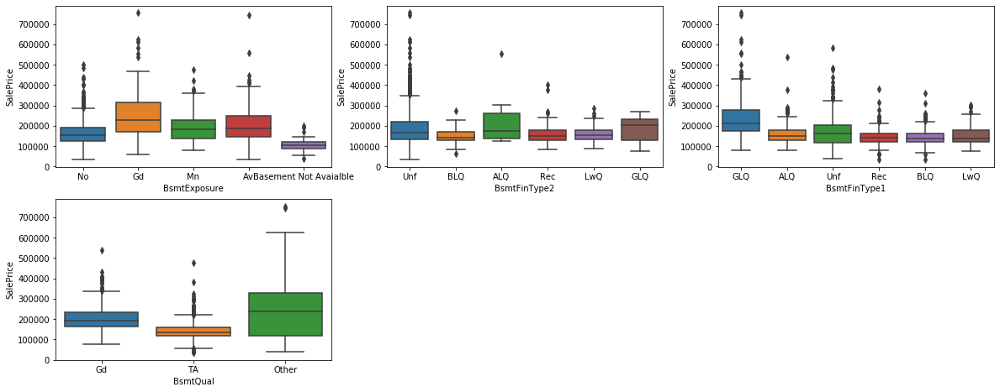

In [27]:
plt.figure(figsize=(20, 12))
plt.subplot(3,3,1)
sns.boxplot(x = 'BsmtExposure', y = 'SalePrice', data = df)
plt.subplot(3,3,2)
sns.boxplot(x = 'BsmtFinType2',y = 'SalePrice', data = df)
plt.subplot(3,3,3)
sns.boxplot(x = 'BsmtFinType1',y = 'SalePrice', data = df)
plt.subplot(3,3,4)
sns.boxplot(x = 'BsmtQual', y = 'SalePrice', data = df)

#Since there is no big change in price of variable BsmtFinType1 and BsmtFinType2 due to change in it different values
So we are removing these two variables.

In [28]:
# Deleting the variables BsmtFinType1 & BsmtFinType2
df = df.drop(['BsmtFinType2','BsmtFinType1'],1)

In [29]:
# Now, lets find the effect of other basement related variable
Bsmt = df[['TotalBsmtSF','BsmtUnfSF','BsmtFinSF2','BsmtFinSF1']]

<Figure size 1440x720 with 0 Axes>

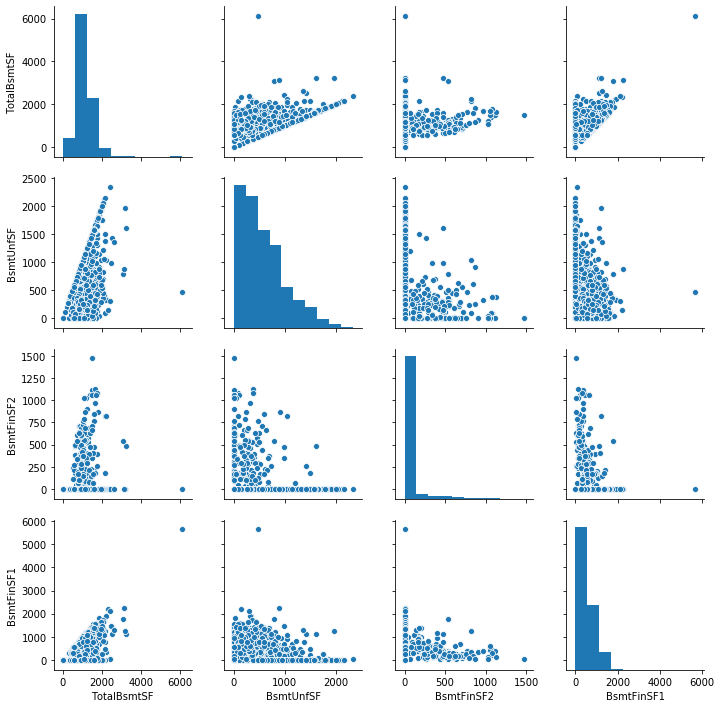

In [30]:
plt.figure(figsize=(20, 10))
sns.pairplot(Bsmt)
plt.show()

Since the variables 'BsmtFinSF1' , 'BsmtFinSF2' and 'BsmtUnfSF' are seems to highly correlated with other Basement realted varibales.so we need to remove them.

In [31]:
# Deleting the variable 'BsmtFinSF1','BsmtFinSF2' and 'BsmtUnfSF'
df = df.drop(['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF'],1)

In [32]:
# Replacing the NaN values
df['GarageType'].replace({np.nan:'Garage Not Avaialble'},inplace=True)
# Getting count of each category under variable "GarageType" and replaing the Nan Values
df['GarageType'].value_counts()

Attchd                  870
Detchd                  387
BuiltIn                  88
Garage Not Avaialble     81
Basment                  19
CarPort                   9
2Types                    6
Name: GarageType, dtype: int64

In [33]:
# Merging the categories Builtin, Basement, Carport and 2Types in single category named as other
df['GarageType'].replace({'Basment':'Garage Not Avaialble'},inplace=True)
df['GarageType'].replace({'CarPort':'Garage Not Avaialble'},inplace=True)
df['GarageType'].replace({'2Types':'Garage Not Avaialble'},inplace=True)
df['GarageType'].value_counts()

Attchd                  870
Detchd                  387
Garage Not Avaialble    115
BuiltIn                  88
Name: GarageType, dtype: int64

In [34]:
# Replacing the NaN values
df['FireplaceQu'].replace({np.nan:'Fireplace Not Avaialble'},inplace=True)
# Getting count of each category under variable "GarageType" and replaing the Nan Values
df['FireplaceQu'].value_counts()

Fireplace Not Avaialble    690
Gd                         380
TA                         313
Fa                          33
Ex                          24
Po                          20
Name: FireplaceQu, dtype: int64

In [35]:
# Merging the categories Gd,TA, Fa, Ex and Po in single category named as Fireplace Available
df['FireplaceQu'].replace({'Gd':'Fireplace Avaialble'},inplace=True)
df['FireplaceQu'].replace({'TA':'Fireplace Avaialble'},inplace=True)
df['FireplaceQu'].replace({'Fa':'Fireplace Avaialble'},inplace=True)
df['FireplaceQu'].replace({'Ex':'Fireplace Avaialble'},inplace=True)
df['FireplaceQu'].replace({'Po':'Fireplace Avaialble'},inplace=True)
df['FireplaceQu'].value_counts()

Fireplace Avaialble        770
Fireplace Not Avaialble    690
Name: FireplaceQu, dtype: int64

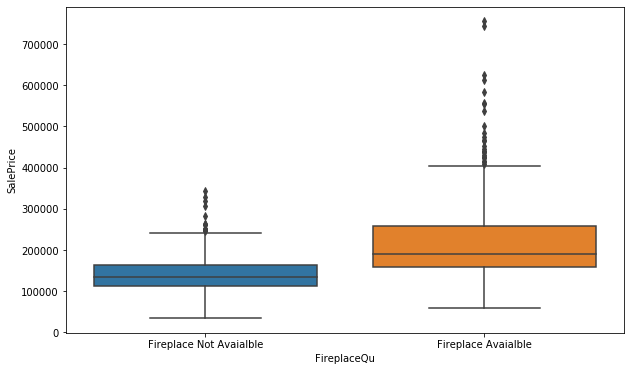

In [36]:
# Box plot for variable FireplaceQu
plt.figure(figsize=(10, 6))
sns.boxplot(x = 'FireplaceQu', y = 'SalePrice', data = df)

In [37]:
df['Electrical'].replace({np.nan:'None'},inplace=True)
df['Electrical'].value_counts()

SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
None        1
Name: Electrical, dtype: int64

In [38]:
# Merging the categoies of Electrical variable
df['Electrical'].replace({'FuseF':'other'},inplace=True)
df['Electrical'].replace({'FuseP':'other'},inplace=True)
df['Electrical'].replace({'FuseA':'other'},inplace=True)
df['Electrical'].replace({'Mix':'other'},inplace=True)
df['Electrical'].replace({'None':'other'},inplace=True)
df['Electrical'].value_counts()

SBrkr    1334
other     126
Name: Electrical, dtype: int64

In [39]:
# Replacing the NaN values
df['GarageCond'].replace({np.nan:'Garage Not Avaialble'},inplace=True)
# Getting count of each category under variable "GarageCond" and replaing the Nan Values
df['GarageCond'].value_counts()

TA                      1326
Garage Not Avaialble      81
Fa                        35
Gd                         9
Po                         7
Ex                         2
Name: GarageCond, dtype: int64

In [40]:
# Merging the categories Gd,TA, Fa, Ex and Po in single category named as Fireplace Available
df['GarageCond'].replace({'Gd':'Fireplace Avaialble'},inplace=True)
df['GarageCond'].replace({'TA':'Fireplace Avaialble'},inplace=True)
df['GarageCond'].replace({'Fa':'Fireplace Avaialble'},inplace=True)
df['GarageCond'].replace({'Ex':'Fireplace Avaialble'},inplace=True)
df['GarageCond'].replace({'Po':'Fireplace Avaialble'},inplace=True)
df['GarageCond'].value_counts()

Fireplace Avaialble     1379
Garage Not Avaialble      81
Name: GarageCond, dtype: int64

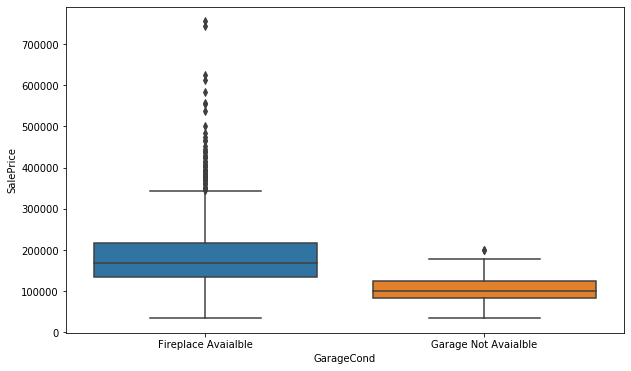

In [41]:
# Box plot for variable FireplaceQu
plt.figure(figsize=(10, 6))
sns.boxplot(x = 'GarageCond', y = 'SalePrice', data = df)

In [42]:
df['GarageFinish'].value_counts()

Unf    605
RFn    422
Fin    352
Name: GarageFinish, dtype: int64

In [43]:
# Replacing the NaN values
df['GarageFinish'].replace({np.nan:'Garage Not Avaialble'},inplace=True)
# Getting count of each category under variable "GarageFinish" and replaing the Nan Values
df['GarageFinish'].value_counts()

Unf                     605
RFn                     422
Fin                     352
Garage Not Avaialble     81
Name: GarageFinish, dtype: int64

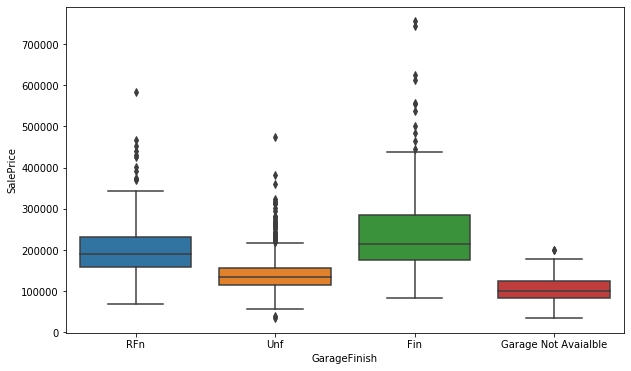

In [44]:
# Box plot for variable FireplaceQu
plt.figure(figsize=(10, 6))
sns.boxplot(x = 'GarageFinish', y = 'SalePrice', data = df)

In [45]:
df['Fence'].value_counts()

MnPrv    157
GdPrv     59
GdWo      54
MnWw      11
Name: Fence, dtype: int64

In [46]:
# Replacing the NaN values
df['Fence'].replace({np.nan:'Fence Not Avaialble'},inplace=True)
# Getting count of each category under variable "GarageFinish" and replaing the Nan Values
df['Fence'].value_counts()

Fence Not Avaialble    1179
MnPrv                   157
GdPrv                    59
GdWo                     54
MnWw                     11
Name: Fence, dtype: int64

In [47]:
# Merging the categories Gd,TA, Fa, Ex and Po in single category named as Fireplace Available
df['Fence'].replace({'MnPrv':'Fence Avaialble'},inplace=True)
df['Fence'].replace({'GdPrv':'Fence Avaialble'},inplace=True)
df['Fence'].replace({'GdWo':'Fence Avaialble'},inplace=True)
df['Fence'].replace({'MnWw':'Fence Avaialble'},inplace=True)
df['Fence'].value_counts()

Fence Not Avaialble    1179
Fence Avaialble         281
Name: Fence, dtype: int64

In [48]:
df['MiscFeature'].value_counts()

Shed    49
Gar2     2
Othr     2
TenC     1
Name: MiscFeature, dtype: int64

In [49]:
# Replacing the NaN values
df['MiscFeature'].replace({np.nan:'Not Avaialble'},inplace=True)
# Getting count of each category under variable "GarageFinish" and replaing the Nan Values
df['MiscFeature'].value_counts()

Not Avaialble    1406
Shed               49
Gar2                2
Othr                2
TenC                1
Name: MiscFeature, dtype: int64

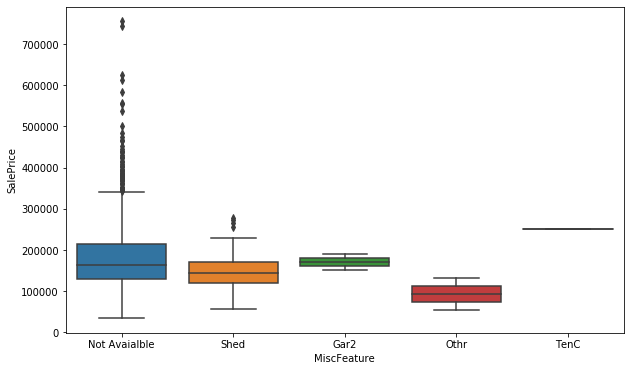

In [50]:
# Box plot for variable FireplaceQu
plt.figure(figsize=(10, 6))
sns.boxplot(x = 'MiscFeature', y = 'SalePrice', data = df)

In [51]:
# Getting the behavior of numerical varibales related to Porch
Porch = df[['OpenPorchSF','ScreenPorch','3SsnPorch','EnclosedPorch']]

<Figure size 1440x720 with 0 Axes>

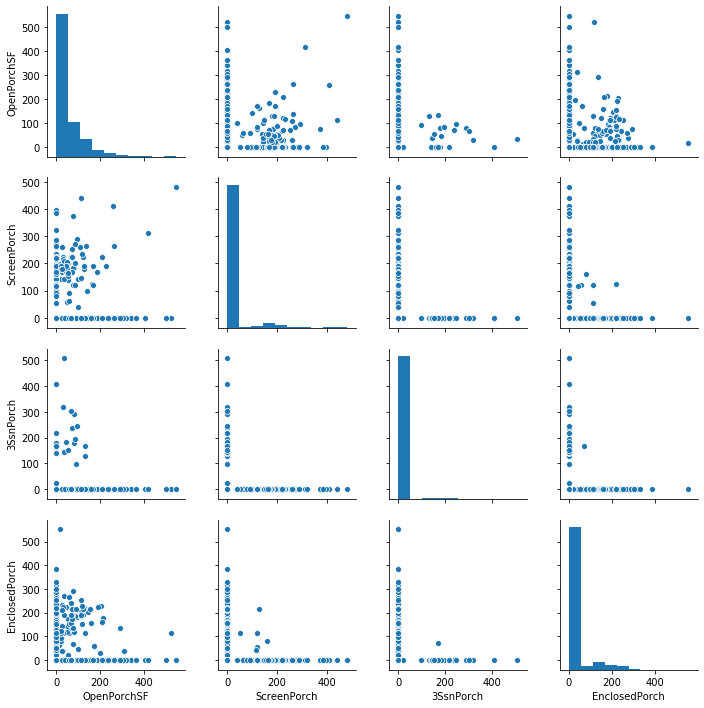

In [52]:
# Plotting the pairplot
plt.figure(figsize=(20, 10))
sns.pairplot(Porch)
plt.show()

In [53]:
#Since 3SsnPorch and ScreenPorch are not at all effective variables, so we are Removing them. 
df = df.drop(['3SsnPorch','ScreenPorch'], 1)

In [54]:
# Replacing the NaN values
df['LotFrontage'].replace({np.nan:'0'},inplace=True)
df['LotFrontage'].value_counts()

0        259
60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
21.0      23
90.0      23
64.0      19
24.0      19
68.0      19
73.0      18
79.0      17
55.0      17
63.0      17
72.0      17
100.0     16
66.0      15
51.0      15
74.0      15
52.0      14
59.0      13
43.0      12
67.0      12
40.0      12
57.0      12
71.0      12
        ... 
121.0      2
118.0      2
116.0      2
114.0      2
313.0      2
134.0      2
124.0      2
174.0      2
109.0      2
101.0      2
160.0      1
33.0       1
39.0       1
168.0      1
38.0       1
106.0      1
153.0      1
46.0       1
152.0      1
150.0      1
149.0      1
144.0      1
141.0      1
140.0      1
138.0      1
137.0      1
128.0      1
112.0      1
111.0      1
182.0      1
Name: LotFrontage, Length: 111, dtype: int64

In [55]:
# Droping the variable LotFrontage
df = df.drop(['LotFrontage'],1)

In [56]:
# Replacing the NaN values
df['MasVnrType'].replace({np.nan:'None'},inplace=True)
df['MasVnrType'].value_counts()

None       872
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

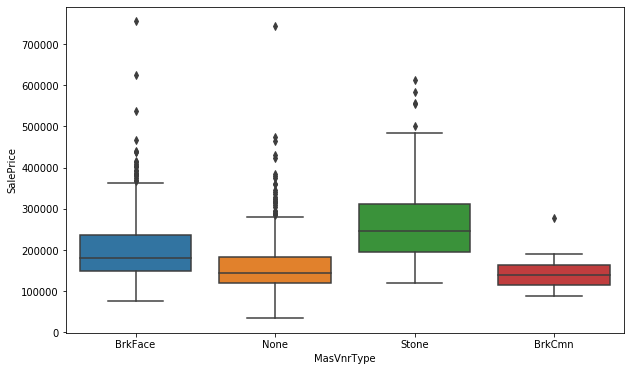

In [57]:
plt.figure(figsize=(10, 6))
sns.boxplot(x = 'MasVnrType', y = 'SalePrice', data = df)

In [58]:
# Dropping MasVnrType as there is not much difference in saleprice based on its categories
df = df.drop(['MasVnrType'],1)

In [59]:
df['Neighborhood'].value_counts()

NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
SWISU       25
StoneBr     25
Blmngtn     17
MeadowV     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

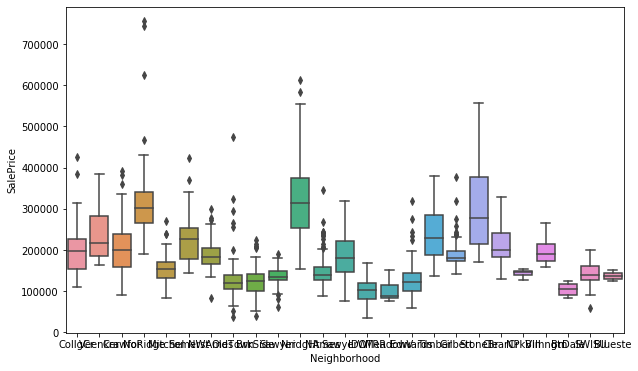

In [60]:
plt.figure(figsize=(10, 6))
sns.boxplot(x = 'Neighborhood', y = 'SalePrice', data = df)

In [61]:
# Merging the categories Blueste,NPkVill, Veenker, BrDale,Blmngtn,MeadowV, StoneBr, SWISU, ClearCr, IDOTRR, Timber, NoRidge, and Mitchel in single category named as others
df['Neighborhood'].replace({'Blueste':'other'},inplace=True)
df['Neighborhood'].replace({'NPkVill':'other'},inplace=True)
df['Neighborhood'].replace({'Veenker':'other'},inplace=True)
df['Neighborhood'].replace({'BrDale':'other'},inplace=True)
df['Neighborhood'].replace({'Blmngtn':'other'},inplace=True)
df['Neighborhood'].replace({'MeadowV':'other'},inplace=True)
df['Neighborhood'].replace({'StoneBr':'other'},inplace=True)
df['Neighborhood'].replace({'SWISU':'other'},inplace=True)
df['Neighborhood'].replace({'ClearCr':'other'},inplace=True)
df['Neighborhood'].replace({'IDOTRR':'other'},inplace=True)
df['Neighborhood'].replace({'Timber':'other'},inplace=True)
df['Neighborhood'].replace({'NoRidge':'other'},inplace=True)
df['Neighborhood'].replace({'Mitchel':'other'},inplace=True)


In [62]:
df['Neighborhood'].value_counts()

other      315
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Name: Neighborhood, dtype: int64

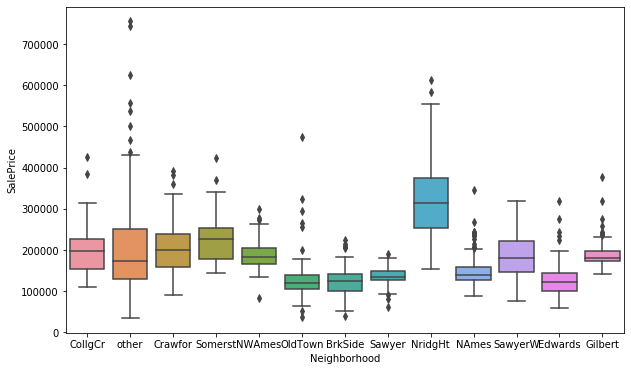

In [63]:
plt.figure(figsize=(10, 6))
sns.boxplot(x = 'Neighborhood', y = 'SalePrice', data = df)

In [64]:
df['GarageYrBlt'].describe()

count    1379.000000
mean     1978.506164
std        24.689725
min      1900.000000
25%      1961.000000
50%      1980.000000
75%      2002.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64

In [65]:
Garage = df[['YearRemodAdd','YearBuilt','GarageYrBlt']]

<Figure size 1440x720 with 0 Axes>

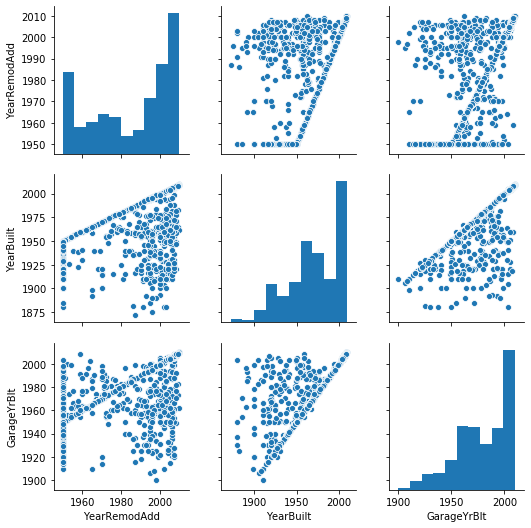

In [66]:
plt.figure(figsize=(20, 10))
sns.pairplot(Garage)
plt.show()

In [67]:
# Based on the above graph Yearbuilt and GarageYrBlt are similar so we are removing the one variable "GarageYrBlt"
df = df.drop(['GarageYrBlt'],1)

In [68]:
df['YearRemodAdd'].describe()

count    1460.000000
mean     1984.865753
std        20.645407
min      1950.000000
25%      1967.000000
50%      1994.000000
75%      2004.000000
max      2010.000000
Name: YearRemodAdd, dtype: float64

In [69]:
df['YearRemodAdd'].value_counts()

1950    178
2006     97
2007     76
2005     73
2004     62
2000     55
2003     51
2002     48
2008     40
1996     36
1998     36
1995     31
1976     30
1999     30
1970     26
1997     25
1977     25
2009     23
1994     22
2001     21
1972     20
1965     19
1993     19
1971     18
1959     18
1968     17
1992     17
1978     16
1966     15
1958     15
       ... 
1962     14
1954     14
1969     14
1991     14
1963     13
1960     12
1967     12
1980     12
1973     11
1964     11
1989     11
1987     10
1975     10
1979     10
1956     10
1953     10
1957      9
1988      9
1955      9
1985      9
1961      8
1981      8
1974      7
1982      7
1984      7
2010      6
1983      5
1952      5
1986      5
1951      4
Name: YearRemodAdd, Length: 61, dtype: int64

In [70]:
df['YearBuilt'].describe()

count    1460.000000
mean     1971.267808
std        30.202904
min      1872.000000
25%      1954.000000
50%      1973.000000
75%      2000.000000
max      2010.000000
Name: YearBuilt, dtype: float64

In [71]:
df['YearBuilt'].value_counts()

2006    67
2005    64
2004    54
2007    49
2003    45
1976    33
1977    32
1920    30
1959    26
1999    25
1998    25
1958    24
1965    24
1970    24
1954    24
2000    24
2002    23
2008    23
1972    23
1968    22
1971    22
1950    20
2001    20
1957    20
1962    19
1994    19
1966    18
2009    18
1995    18
1940    18
        ..
1986     5
1952     5
1880     4
1929     4
1932     4
1938     4
1983     4
1927     3
1919     3
1934     3
1989     3
1987     3
1912     3
1885     2
1892     2
1890     2
1942     2
1908     2
1882     1
1875     1
1893     1
2010     1
1898     1
1904     1
1905     1
1906     1
1911     1
1913     1
1917     1
1872     1
Name: YearBuilt, Length: 112, dtype: int64

In [72]:
Numerical_Variables = df.select_dtypes(include=['float64', 'int64'])
Numerical_Variables.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,TotalBsmtSF,1stFlrSF,2ndFlrSF,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,8450,7,5,2003,2003,196.0,856,856,854,...,2,548,0,61,0,0,0,2,2008,208500
1,20,9600,6,8,1976,1976,0.0,1262,1262,0,...,2,460,298,0,0,0,0,5,2007,181500
2,60,11250,7,5,2001,2002,162.0,920,920,866,...,2,608,0,42,0,0,0,9,2008,223500
3,70,9550,7,5,1915,1970,0.0,756,961,756,...,3,642,0,35,272,0,0,2,2006,140000
4,60,14260,8,5,2000,2000,350.0,1145,1145,1053,...,3,836,192,84,0,0,0,12,2008,250000


In [73]:
Correlation = Numerical_Variables.corr()

In [74]:
Correlation

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,TotalBsmtSF,1stFlrSF,2ndFlrSF,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.022936,-0.238518,-0.251758,0.307886,...,-0.040110,-0.098672,-0.012579,-0.006100,-0.012037,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotArea,-0.139781,1.000000,0.105806,-0.005636,0.014228,0.013788,0.104160,0.260833,0.299475,0.050986,...,0.154871,0.180403,0.171698,0.084774,-0.018340,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,0.032628,0.105806,1.000000,-0.091932,0.572323,0.550684,0.411876,0.537808,0.476224,0.295493,...,0.600671,0.562022,0.238923,0.308819,-0.113937,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,-0.059316,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.128101,-0.171098,-0.144203,0.028942,...,-0.185758,-0.151521,-0.003334,-0.032589,0.070356,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,0.027850,0.014228,0.572323,-0.375983,1.000000,0.592855,0.315707,0.391452,0.281986,0.010308,...,0.537850,0.478954,0.224880,0.188686,-0.387268,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,0.040581,0.013788,0.550684,0.073741,0.592855,1.000000,0.179618,0.291066,0.240379,0.140024,...,0.420622,0.371600,0.205726,0.226298,-0.193919,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,0.022936,0.104160,0.411876,-0.128101,0.315707,0.179618,1.000000,0.363936,0.344501,0.174561,...,0.364204,0.373066,0.159718,0.125703,-0.110204,0.011723,-0.029815,-0.005965,-0.008201,0.477493
TotalBsmtSF,-0.238518,0.260833,0.537808,-0.171098,0.391452,0.291066,0.363936,1.000000,0.819530,-0.174512,...,0.434585,0.486665,0.232019,0.247264,-0.095478,0.126053,-0.018479,0.013196,-0.014969,0.613581
1stFlrSF,-0.251758,0.299475,0.476224,-0.144203,0.281986,0.240379,0.344501,0.819530,1.000000,-0.202646,...,0.439317,0.489782,0.235459,0.211671,-0.065292,0.131525,-0.021096,0.031372,-0.013604,0.605852
2ndFlrSF,0.307886,0.050986,0.295493,0.028942,0.010308,0.140024,0.174561,-0.174512,-0.202646,1.000000,...,0.183926,0.138347,0.092165,0.208026,0.061989,0.081487,0.016197,0.035164,-0.028700,0.319334


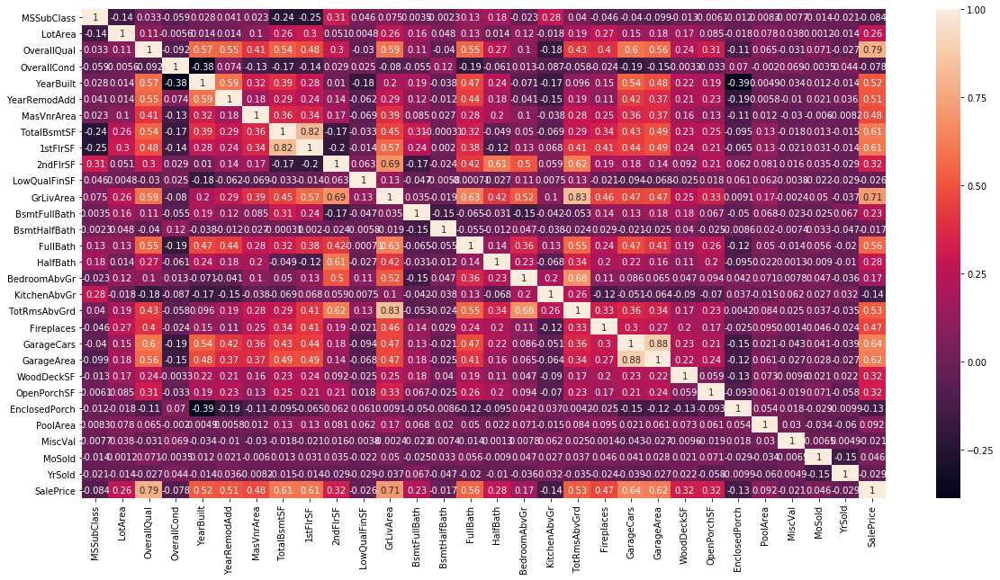

In [75]:
plt.figure(figsize=(20,10))
sns.heatmap(Correlation, annot=True)
plt.show()

In [76]:
df = df.dropna(how='any',axis=0)

In [77]:
df.describe()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,TotalBsmtSF,1stFlrSF,2ndFlrSF,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,...,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000
mean,56.949036,10507.276171,6.092975,5.579201,1971.116391,1984.775482,103.685262,1055.847107,1161.270661,346.944215,...,1.765152,472.475207,94.416667,46.390496,21.937328,2.774105,43.728650,6.318182,2007.815427,180615.063361
std,42.340097,9989.563592,1.381289,1.113136,30.193761,20.652466,181.066207,438.119089,385.018424,436.370724,...,0.748496,214.106397,125.393706,66.048619,61.089879,40.287389,497.478278,2.699644,1.328927,79285.541485
min,20.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,334.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,7538.750000,5.000000,5.000000,1954.000000,1966.000000,0.000000,794.750000,882.000000,0.000000,...,1.000000,327.750000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129900.000000
50%,50.000000,9478.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,990.500000,1086.000000,0.000000,...,2.000000,478.000000,0.000000,24.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,162700.000000
75%,70.000000,11600.000000,7.000000,6.000000,2000.000000,2004.000000,166.000000,1297.250000,1391.000000,728.000000,...,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,6110.000000,4692.000000,2065.000000,...,4.000000,1418.000000,857.000000,547.000000,552.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [78]:
df.shape

(1452, 66)

<Figure size 1440x720 with 0 Axes>

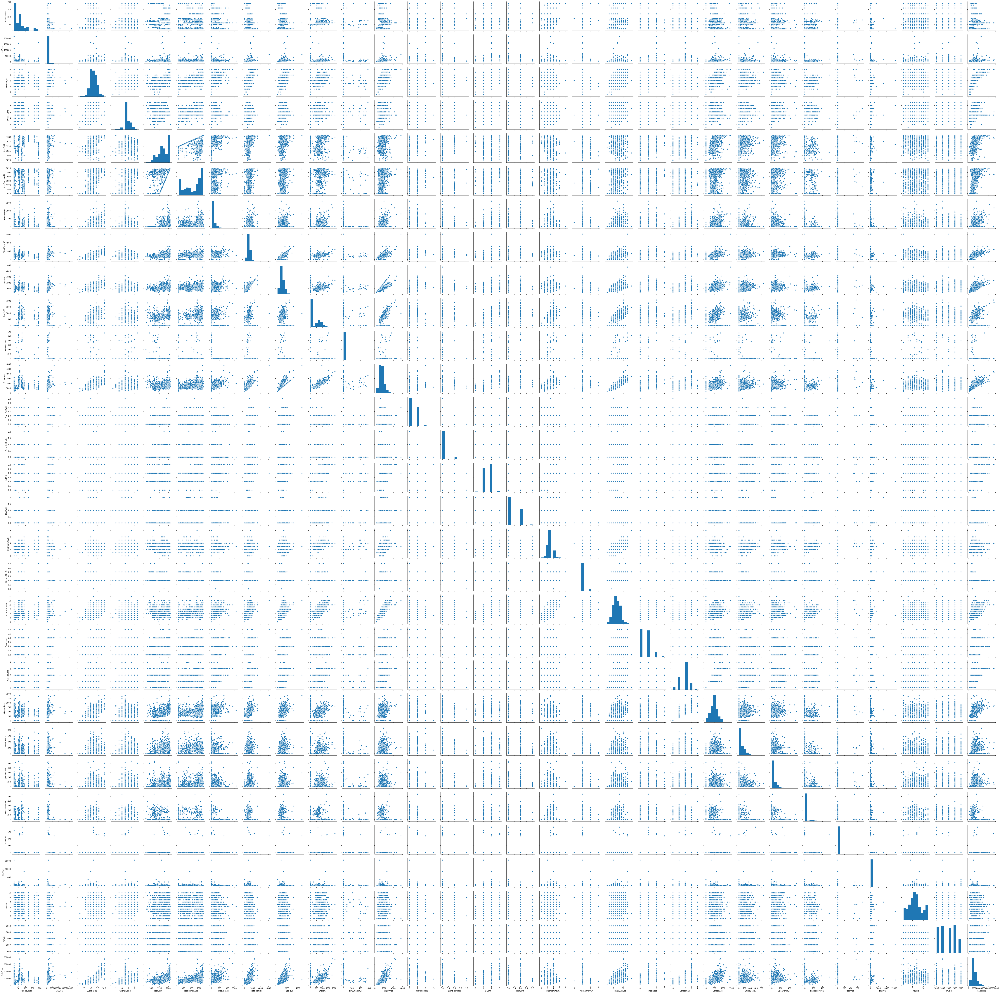

In [79]:
# Scatter plot of df
plt.figure(figsize=(20, 10))
sns.pairplot(df)
plt.show()

In [80]:
# Extracting all the categorical variable from the data
Categorical = df.select_dtypes(include=['object'])

In [81]:
Categorical

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,Functional,FireplaceQu,GarageType,GarageFinish,GarageCond,PavedDrive,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Typ,Fireplace Not Avaialble,Attchd,RFn,Fireplace Avaialble,Y,Fence Not Avaialble,Not Avaialble,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,other,Feedr,Norm,...,Typ,Fireplace Avaialble,Attchd,RFn,Fireplace Avaialble,Y,Fence Not Avaialble,Not Avaialble,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Typ,Fireplace Avaialble,Attchd,RFn,Fireplace Avaialble,Y,Fence Not Avaialble,Not Avaialble,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,Typ,Fireplace Avaialble,Detchd,Unf,Fireplace Avaialble,Y,Fence Not Avaialble,Not Avaialble,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,other,Norm,Norm,...,Typ,Fireplace Avaialble,Attchd,RFn,Fireplace Avaialble,Y,Fence Not Avaialble,Not Avaialble,WD,Normal
5,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,other,Norm,Norm,...,Typ,Fireplace Not Avaialble,Attchd,Unf,Fireplace Avaialble,Y,Fence Avaialble,Shed,WD,Normal
6,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,...,Typ,Fireplace Avaialble,Attchd,RFn,Fireplace Avaialble,Y,Fence Not Avaialble,Not Avaialble,WD,Normal
7,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,...,Typ,Fireplace Avaialble,Attchd,RFn,Fireplace Avaialble,Y,Fence Not Avaialble,Shed,WD,Normal
8,RM,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,...,Min1,Fireplace Avaialble,Detchd,Unf,Fireplace Avaialble,Y,Fence Not Avaialble,Not Avaialble,WD,Abnorml
9,RL,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,...,Typ,Fireplace Avaialble,Attchd,RFn,Fireplace Avaialble,Y,Fence Not Avaialble,Not Avaialble,WD,Normal


In [82]:
Dummy_Cat = pd.get_dummies(Categorical, drop_first=True)
Dummy_Cat

,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
1,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
2,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
3,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
6,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
7,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
8,0,0,0,1,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0


In [83]:
df = df.drop(list(Categorical.columns), axis=1)

In [84]:
df = pd.concat([df, Dummy_Cat], axis=1)

In [85]:
df

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,TotalBsmtSF,1stFlrSF,2ndFlrSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,8450,7,5,2003,2003,196.0,856,856,854,...,0,0,0,0,1,0,0,0,1,0
1,20,9600,6,8,1976,1976,0.0,1262,1262,0,...,0,0,0,0,1,0,0,0,1,0
2,60,11250,7,5,2001,2002,162.0,920,920,866,...,0,0,0,0,1,0,0,0,1,0
3,70,9550,7,5,1915,1970,0.0,756,961,756,...,0,0,0,0,1,0,0,0,0,0
4,60,14260,8,5,2000,2000,350.0,1145,1145,1053,...,0,0,0,0,1,0,0,0,1,0
5,50,14115,5,5,1993,1995,0.0,796,796,566,...,0,0,0,0,1,0,0,0,1,0
6,20,10084,8,5,2004,2005,186.0,1686,1694,0,...,0,0,0,0,1,0,0,0,1,0
7,60,10382,7,6,1973,1973,240.0,1107,1107,983,...,0,0,0,0,1,0,0,0,1,0
8,50,6120,7,5,1931,1950,0.0,952,1022,752,...,0,0,0,0,1,0,0,0,0,0
9,190,7420,5,6,1939,1950,0.0,991,1077,0,...,0,0,0,0,1,0,0,0,1,0


In [86]:
y = df['SalePrice']

In [87]:
df = df.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)


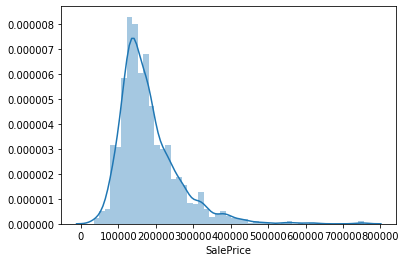

In [88]:
# Ploting the distribution of "Saleprice"
sns.distplot(df['SalePrice'])
plt.show()

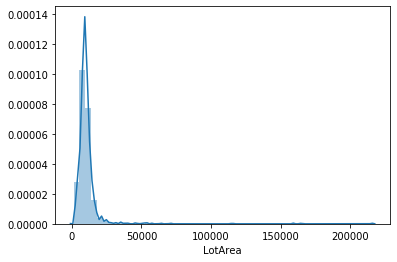

In [89]:
# Ploting the distribution of "LotArea"
sns.distplot(df['LotArea'])
plt.show()

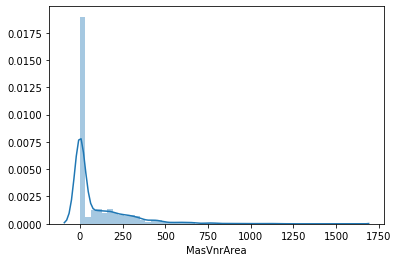

In [90]:
# Ploting the distribution of "MasVnrArea"
sns.distplot(df['MasVnrArea'])
plt.show()

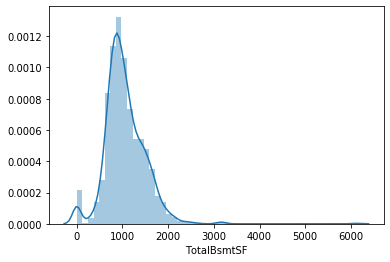

In [91]:
# Ploting the distribution of "TotalBsmtSF"
sns.distplot(df['TotalBsmtSF'])
plt.show()

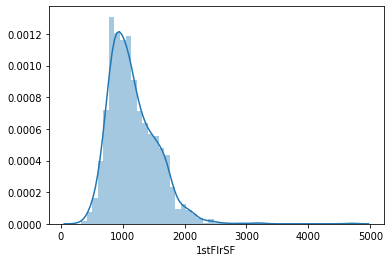

In [92]:
# Ploting the distribution of "1stFlrSF"
sns.distplot(df['1stFlrSF'])
plt.show()

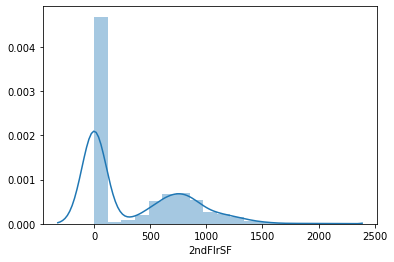

In [93]:
# Ploting the distribution of "2ndFlrSF"
sns.distplot(df['2ndFlrSF'])
plt.show()

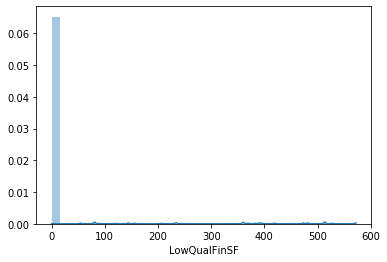

In [94]:
# Ploting the distribution of "LowQualFinSF"
sns.distplot(df['LowQualFinSF'])
plt.show()

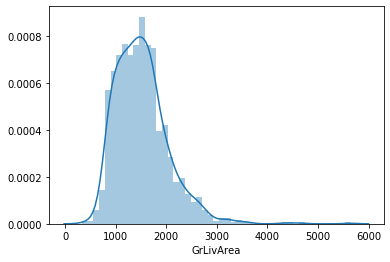

In [95]:
sns.distplot(df['GrLivArea'])
plt.show()

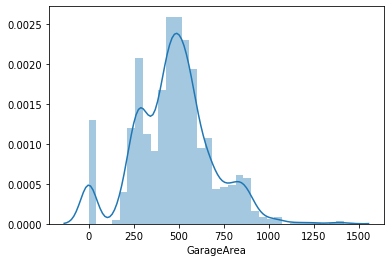

In [96]:
sns.distplot(df['GarageArea'])
plt.show()

In [97]:
from sklearn.preprocessing import StandardScaler

col = list(df.columns)
scaler = StandardScaler()

df = scaler.fit_transform(df)
df = pd.DataFrame(df,columns=col)
df.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,TotalBsmtSF,1stFlrSF,2ndFlrSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.072083,-0.206014,0.656877,-0.520512,1.056331,0.882742,0.510015,-0.456305,-0.793146,1.162384,...,-0.058783,-0.058783,-0.298785,-0.045502,0.388014,-0.052559,-0.08737,-0.11818,0.464844,-0.302868
1,-0.872973,-0.090854,-0.067334,2.175506,0.161798,-0.425058,-0.572835,0.470703,0.261712,-0.795342,...,-0.058783,-0.058783,-0.298785,-0.045502,0.388014,-0.052559,-0.08737,-0.11818,0.464844,-0.302868
2,0.072083,0.074376,0.656877,-0.520512,0.990069,0.834305,0.322174,-0.310176,-0.626863,1.189893,...,-0.058783,-0.058783,-0.298785,-0.045502,0.388014,-0.052559,-0.08737,-0.11818,0.464844,-0.302868
3,0.308347,-0.095861,0.656877,-0.520512,-1.859183,-0.715681,-0.572835,-0.684632,-0.520338,0.937727,...,-0.058783,-0.058783,-0.298785,-0.045502,0.388014,-0.052559,-0.08737,-0.11818,-2.151257,-0.302868
4,0.072083,0.375794,1.381088,-0.520512,0.956938,0.737431,1.360826,0.203560,-0.042274,1.618576,...,-0.058783,-0.058783,-0.298785,-0.045502,0.388014,-0.052559,-0.08737,-0.11818,0.464844,-0.302868


In [98]:
# split into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df, y,train_size=0.7,test_size = 0.3, random_state=100)
print(X_train.shape)
print(X_test.shape)

(1016, 193)
(436, 193)


# Ridge Regression

In [99]:
# list of alphas to tune
Parameters = {'alpha': [ 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100,200, 500, 1000]}
ridge = Ridge()
# cross validation
folds = 5
Model = GridSearchCV(estimator = ridge,param_grid = Parameters,scoring= 'neg_mean_absolute_error',cv = folds,return_train_score=True,verbose = 1)
Model.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    0.8s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100,
                                   200, 500, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_absolute_error', verbose=1)

In [100]:
outcome = pd.DataFrame(Model.cv_results_)
outcome = outcome[outcome['param_alpha']<=1000]
outcome.head()


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.013593,0.002797,0.002598,0.000490,5,{'alpha': 5.0},-2002.795525,-1479.846200,-1470.186417,-1278.521977,...,-1559.759879,241.037742,1,-1202.148408,-1067.615676,-1086.021572,-1105.564116,-1118.809120,-1116.031778,46.428635
1,0.009795,0.001832,0.002199,0.000403,6,{'alpha': 6.0},-2338.561302,-1731.135964,-1721.174221,-1497.980754,...,-1824.566591,279.725395,2,-1407.204005,-1252.920646,-1273.340867,-1297.354060,-1310.294057,-1308.222727,53.281847
2,0.010594,0.001624,0.001999,0.000632,7,{'alpha': 7.0},-2657.868329,-1970.379515,-1960.772249,-1708.530071,...,-2077.108842,316.003547,3,-1602.988210,-1430.572854,-1452.689689,-1481.168378,-1493.306663,-1492.145159,59.591784
3,0.010994,0.002447,0.001998,0.000632,8,{'alpha': 8.0},-2961.930991,-2198.444022,-2189.966029,-1910.642888,...,-2318.295098,350.085294,4,-1790.337925,-1601.082326,-1624.559630,-1657.562030,-1668.625283,-1668.433439,65.482840
4,0.008597,0.000488,0.001597,0.000489,9,{'alpha': 9.0},-3251.996699,-2416.131674,-2409.422233,-2104.884195,...,-2549.055407,382.204596,5,-1969.750382,-1764.885387,-1789.518016,-1827.025992,-1836.771029,-1837.590161,70.958456


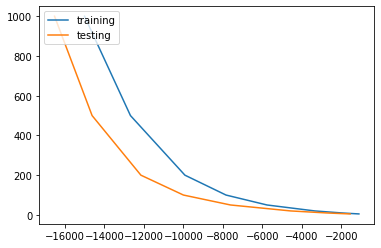

In [101]:
# plotting mean test and train scoes with alpha 
outcome['param_alpha'] = outcome['param_alpha'].astype('int32')

# plotting
plt.plot(outcome['mean_train_score'],outcome['param_alpha'])
plt.plot(outcome['mean_test_score'],outcome['param_alpha'])
plt.legend(['training', 'testing'], loc='upper left')
plt.show()

In [102]:
# Knowing the best 
Model.best_params_

{'alpha': 5.0}

In [103]:
alpha = 5
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
ridge.coef_

array([-4.00927524e+01,  4.11984969e+02,  7.98676327e+02,  4.34939423e+02,
        6.20667687e+02,  1.02437325e+02,  2.88753037e+02,  8.48930118e+02,
        4.03955531e+02,  1.11320336e+03, -2.12177112e+01,  1.21809625e+03,
        4.14801587e+02, -4.16778166e+00,  9.84681915e+01,  1.11439111e+02,
       -3.64379490e+02, -2.71756498e+02,  1.21509563e+02,  1.43916362e+02,
        2.84515789e+02,  5.12125789e+01,  7.60972406e+01,  1.56510155e+01,
       -3.56150514e+01,  3.40137191e+02,  3.46714221e+02,  1.56928069e+01,
        6.26976515e+01,  7.42780199e+04,  3.33234851e+02,  6.51146195e+01,
        3.78902296e+02,  1.81570557e+02,  1.13296855e+02,  1.03149254e+01,
        2.03809152e+01, -5.03172960e+01,  4.89708545e+01, -1.43214639e+02,
       -5.16780039e-01, -3.38712060e+01,  1.07602495e+02, -6.02318694e+01,
       -3.69188748e+01, -3.16156196e+01,  4.04213087e+01, -3.21247925e+02,
       -2.87243524e+02,  1.52364087e+02, -1.67282512e+02, -2.30361001e+02,
       -3.47127684e+02, -

In [104]:
Prediction = ridge.predict(X_test)
Error = np.mean((Prediction - y_test)**2)
Error

9267691.085513864

In [105]:
ridge.score(X_test,y_test)

0.9986418338697302

## Lasso Regression

In [106]:
lasso = Lasso()
Model = GridSearchCV(estimator = lasso,param_grid = Parameters,scoring= 'neg_mean_absolute_error',cv = folds,return_train_score=True,verbose = 1) 
Model.fit(X_train, y_train)                          

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    1.5s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100,
                                   200, 500, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_absolute_error', verbose=1)

In [107]:
Outcomes = pd.DataFrame(Model.cv_results_)

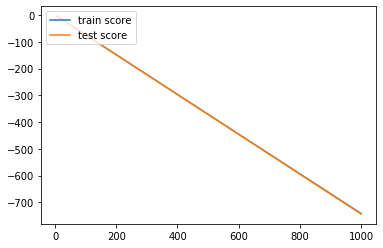

In [108]:
# plotting mean test and train scoes with alpha 
Outcomes['param_alpha'] = Outcomes['param_alpha'].astype('float32')

# plotting
plt.plot(Outcomes['param_alpha'],Outcomes['mean_train_score'])
plt.plot(Outcomes['param_alpha'],Outcomes['mean_test_score'])
plt.legend(['train score','test score'], loc='upper left')
plt.show()

In [109]:

Model.best_params_

{'alpha': 6.0}

In [110]:
alpha = 6

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 

Lasso(alpha=6, copy_X=True, fit_intercept=True, max_iter=1000, normalize=False,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False)

In [111]:
lasso.coef_

array([   -0.       ,     0.       ,     0.       ,     0.       ,
           0.       ,     0.       ,     0.       ,     0.       ,
           0.       ,     0.       ,    -0.       ,     0.       ,
           0.       ,    -0.       ,     0.       ,     0.       ,
           0.       ,    -0.       ,     0.       ,     0.       ,
           0.       ,     0.       ,     0.       ,     0.       ,
          -0.       ,     0.       ,    -0.       ,    -0.       ,
           0.       , 79249.9749748,    -0.       ,    -0.       ,
           0.       ,    -0.       ,     0.       ,     0.       ,
           0.       ,    -0.       ,     0.       ,     0.       ,
          -0.       ,    -0.       ,     0.       ,     0.       ,
           0.       ,    -0.       ,     0.       ,     0.       ,
           0.       ,     0.       ,    -0.       ,    -0.       ,
          -0.       ,     0.       ,     0.       ,    -0.       ,
          -0.       ,     0.       ,    -0.       ,     0.    

In [112]:
alpha = 0.1
lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)

pred = lasso.predict(X_test)

In [113]:
Error = np.mean((pred - y_test)**2)
Error

23739.21375518145

In [114]:
lasso.score(X_test,y_test)

0.9999965210540809